In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib 
matplotlib.rcParams["figure.figsize"] = (20,10)

# loading the dataset

In [2]:
df1 = pd.read_csv("Bengaluru_House_Data.csv")
df1.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [3]:
df1.shape

(13320, 9)

In [4]:
pd.get_dummies(df1['location'])

,Anekal,Banaswadi,Basavangudi,Bhoganhalli,Devarabeesana Halli,Devarachikkanahalli,Electronic City,Mysore Highway,Rachenahalli,Sector 1 HSR Layout,...,rr nagar,sankeswari,sapthagiri Layout,sarjapura main road,singapura paradise,t.c palya,tc.palya,vinayakanagar,"white field,kadugodi",whitefiled
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13315,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13316,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13317,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
13318,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df1.shape

(13320, 9)

In [6]:
 #df106.head(10)

In [7]:
df1.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')

In [8]:
df1['area_type'].value_counts()

Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: area_type, dtype: int64

In [9]:
df1['availability'].value_counts()

Ready To Move    10581
18-Dec             307
18-May             295
18-Apr             271
18-Aug             200
                 ...  
15-Aug               1
17-Jan               1
16-Nov               1
16-Jan               1
14-Jul               1
Name: availability, Length: 81, dtype: int64

In [10]:
df1['area_type'].value_counts()

Super built-up  Area    8790
Built-up  Area          2418
Plot  Area              2025
Carpet  Area              87
Name: area_type, dtype: int64

In [11]:
df2 = df1.drop(['area_type','society','balcony','availability'],axis= 'columns')
df2.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00


# checking for null values and removing them

In [12]:
df2.isnull().sum()

location       1
size          16
total_sqft     0
bath          73
price          0
dtype: int64

In [13]:
df3=df2.dropna()
df3.isnull().sum()

location      0
size          0
total_sqft    0
bath          0
price         0
dtype: int64

In [14]:
df3.shape

(13246, 5)

In [15]:
df3.head(50)

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00
5,Whitefield,2 BHK,1170,2.0,38.00
6,Old Airport Road,4 BHK,2732,4.0,204.00
7,Rajaji Nagar,4 BHK,3300,4.0,600.00
8,Marathahalli,3 BHK,1310,3.0,63.25
9,Gandhi Bazar,6 Bedroom,1020,6.0,370.00


In [16]:
df3.iloc[407]

location      Sanne Amanikere
size                    2 BHK
total_sqft               1185
bath                      2.0
price                    38.0
Name: 411, dtype: object

In [17]:
df3['bhk']= df3['size'].apply(lambda x: int(x.split(' ')[0]))
df3.bhk.unique()

C:\Users\ronal\AppData\Local\Temp\ipykernel_18328\1236678463.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['bhk']= df3['size'].apply(lambda x: int(x.split(' ')[0]))


array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18], dtype=int64)

In [18]:
df3.price.unique()

array([ 39.07, 120.  ,  62.  , ...,  40.14, 231.  , 488.  ])

In [19]:
df3.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2


In [20]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

# size values that are not of type "float"

In [21]:
df3[~df3['size'].apply(is_float)].head(10)

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4
2,Uttarahalli,3 BHK,1440,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3
4,Kothanur,2 BHK,1200,2.0,51.00,2
5,Whitefield,2 BHK,1170,2.0,38.00,2
6,Old Airport Road,4 BHK,2732,4.0,204.00,4
7,Rajaji Nagar,4 BHK,3300,4.0,600.00,4
8,Marathahalli,3 BHK,1310,3.0,63.25,3
9,Gandhi Bazar,6 Bedroom,1020,6.0,370.00,6


# values with total square feet with range values

In [22]:
df3[~df3['total_sqft'].apply(is_float)].head(10)

,location,size,total_sqft,bath,price,bhk
30,Yelahanka,4 BHK,2100 - 2850,4.0,186.000,4
122,Hebbal,4 BHK,3067 - 8156,4.0,477.000,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,54.005,2
165,Sarjapur,2 BHK,1145 - 1340,2.0,43.490,2
188,KR Puram,2 BHK,1015 - 1540,2.0,56.800,2
410,Kengeri,1 BHK,34.46Sq. Meter,1.0,18.500,1
549,Hennur Road,2 BHK,1195 - 1440,2.0,63.770,2
648,Arekere,9 Bedroom,4125Perch,9.0,265.000,9
661,Yelahanka,2 BHK,1120 - 1145,2.0,48.130,2
672,Bettahalsoor,4 Bedroom,3090 - 5002,4.0,445.000,4


In [23]:
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None   

In [24]:
df4=df3.copy()

In [25]:
df4.total_sqft = df4.total_sqft.apply(convert_sqft_to_num)

df4.head(2)

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4


In [26]:
df3.bhk.value_counts()

2     5527
3     4832
4     1395
1      649
5      353
6      221
7      100
8       89
9       54
10      14
11       4
27       1
19       1
16       1
43       1
14       1
12       1
13       1
18       1
Name: bhk, dtype: int64

In [27]:
df3['bhk'].value_counts()

2     5527
3     4832
4     1395
1      649
5      353
6      221
7      100
8       89
9       54
10      14
11       4
27       1
19       1
16       1
43       1
14       1
12       1
13       1
18       1
Name: bhk, dtype: int64

In [28]:
df3.bhk.unique()

array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18], dtype=int64)

In [29]:
df4.head()

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2


In [30]:
df4 = df4[df4.total_sqft.notnull()]

In [31]:
df4[ df4['bhk'] > 3].head(10)

,location,size,total_sqft,bath,price,bhk
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.0,4
6,Old Airport Road,4 BHK,2732.0,4.0,204.0,4
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.0,4
9,Gandhi Bazar,6 Bedroom,1020.0,6.0,370.0,6
11,Whitefield,4 Bedroom,2785.0,5.0,295.0,4
22,Thanisandra,4 Bedroom,2800.0,5.0,380.0,4
30,Yelahanka,4 BHK,2475.0,4.0,186.0,4
45,HSR Layout,8 Bedroom,600.0,9.0,200.0,8
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.0,6
62,Whitefield,4 Bedroom,5700.0,5.0,650.0,4


In [32]:
df4[df4.total_sqft.notnull()].head(10)

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3
4,Kothanur,2 BHK,1200.0,2.0,51.00,2
5,Whitefield,2 BHK,1170.0,2.0,38.00,2
6,Old Airport Road,4 BHK,2732.0,4.0,204.00,4
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.00,4
8,Marathahalli,3 BHK,1310.0,3.0,63.25,3
9,Gandhi Bazar,6 Bedroom,1020.0,6.0,370.00,6


# creating price per sqft parameter

In [33]:
df5=df4.copy()
df5['price_per_sqft']=df5['price']*100000/df5['total_sqft']
df5.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [34]:
df5['price_per_sqft']=df5['price_per_sqft'].apply(lambda x: int(x))
df5.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250


In [35]:
df5_stats=df5['price_per_sqft'].describe()
df5_stats

count    1.320000e+04
mean     7.920336e+03
std      1.067272e+05
min      2.670000e+02
25%      4.267000e+03
50%      5.438000e+03
75%      7.317000e+03
max      1.200000e+07
Name: price_per_sqft, dtype: float64

In [36]:
df5.to_csv("bhp.csv",index=False)

In [37]:
len(df5.price_per_sqft)

13200

In [38]:
df5.price_per_sqft.shape

(13200,)

In [39]:
len(df5.price_per_sqft.unique())

4951

In [40]:
df5.location = df5.location.apply(lambda x: x.strip())

In [41]:
location_stats=df5.groupby('location')['location'].agg('count').sort_values(ascending=False)
location_stats

location
Whitefield               533
Sarjapur  Road           392
Electronic City          304
Kanakpura Road           264
Thanisandra              235
                        ... 
1 Giri Nagar               1
Kanakapura Road,           1
Kanakapura main  Road      1
Kannur                     1
whitefiled                 1
Name: location, Length: 1287, dtype: int64

In [42]:
len(location_stats[location_stats <= 10])

1047

In [43]:
df5[df5.bhk >2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.0,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.0,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.0,3,6245
6,Old Airport Road,4 BHK,2732.0,4.0,204.0,4,7467
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.0,4,18181
...,...,...,...,...,...,...,...
13313,Uttarahalli,3 BHK,1345.0,2.0,57.0,3,4237
13314,Green Glen Layout,3 BHK,1715.0,3.0,112.0,3,6530
13315,Whitefield,5 Bedroom,3453.0,4.0,231.0,5,6689
13316,Richards Town,4 BHK,3600.0,5.0,400.0,4,11111


In [44]:
df5[df5['bhk']>2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.0,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.0,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.0,3,6245
6,Old Airport Road,4 BHK,2732.0,4.0,204.0,4,7467
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.0,4,18181
...,...,...,...,...,...,...,...
13313,Uttarahalli,3 BHK,1345.0,2.0,57.0,3,4237
13314,Green Glen Layout,3 BHK,1715.0,3.0,112.0,3,6530
13315,Whitefield,5 Bedroom,3453.0,4.0,231.0,5,6689
13316,Richards Town,4 BHK,3600.0,5.0,400.0,4,11111


In [45]:
location_stats_less_than_10 = location_stats[location_stats<=10]
location_stats_less_than_10
df5.location = df5.location.apply(lambda x: 'other' if x in location_stats_less_than_10 else x)
len(df5.location.unique())

241

In [46]:
len(location_stats.unique())

89

In [47]:
df5[df5.total_sqft/df5.bhk<300].head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.0,6,36274
45,HSR Layout,8 Bedroom,600.0,9.0,200.0,8,33333
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.0,6,10660
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,85.0,8,6296
70,other,3 Bedroom,500.0,3.0,100.0,3,20000


In [48]:
df6 =df5[df5.total_sqft/df5.bhk >=300]
df6.shape


(12456, 7)

In [49]:
df6.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250


In [50]:
df5.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250


In [51]:
df600 =df5[df5.total_sqft/df5.bhk <300]
df600.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.0,6,36274
45,HSR Layout,8 Bedroom,600.0,9.0,200.0,8,33333
58,Murugeshpalya,6 Bedroom,1407.0,4.0,150.0,6,10660
68,Devarachikkanahalli,8 Bedroom,1350.0,7.0,85.0,8,6296
70,other,3 Bedroom,500.0,3.0,100.0,3,20000


In [52]:
df6.price_per_sqft.describe()

count     12456.000000
mean       6308.075225
std        4168.131965
min         267.000000
25%        4210.000000
50%        5294.000000
75%        6916.000000
max      176470.000000
Name: price_per_sqft, dtype: float64

In [53]:
def remove_pps_outliers(df):
    df_out = pd.DataFrame()
    for key, subdf in df.groupby('location'):
        m = np.mean(subdf.price_per_sqft)
        st = np.std(subdf.price_per_sqft)
        reduced_df = subdf[(subdf.price_per_sqft>(m-st)) & (subdf.price_per_sqft<=(m+st))]
        df_out = pd.concat([df_out,reduced_df],ignore_index=True)
    return df_out
df7 = remove_pps_outliers(df6)
df7.shape

(10243, 7)

# removing outliers

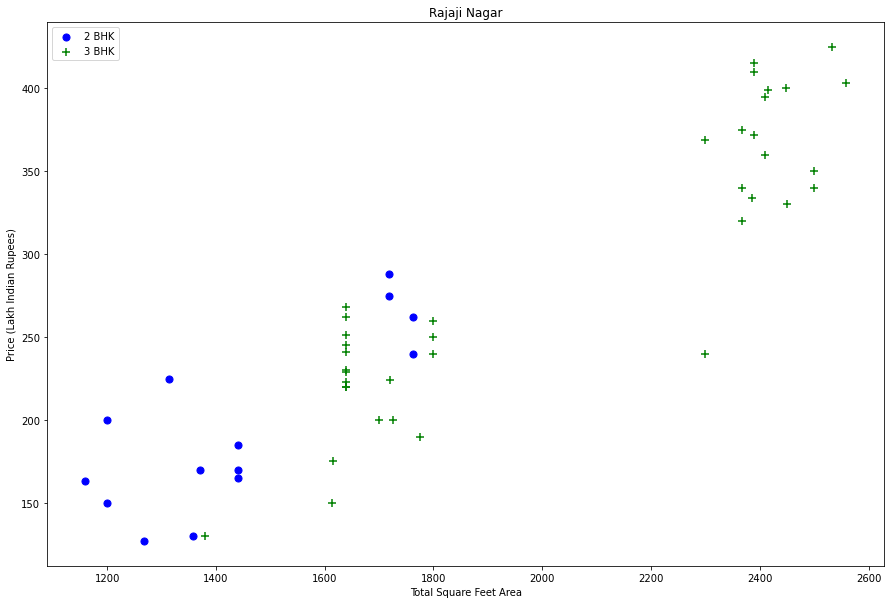

In [54]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.bhk==2)]
    bhk3 = df[(df.location==location) & (df.bhk==3)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.total_sqft,bhk2.price,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.total_sqft,bhk3.price,marker='+', color='green',label='3 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price (Lakh Indian Rupees)")
    plt.title(location)
    plt.legend()
    
plot_scatter_chart(df7,"Rajaji Nagar")

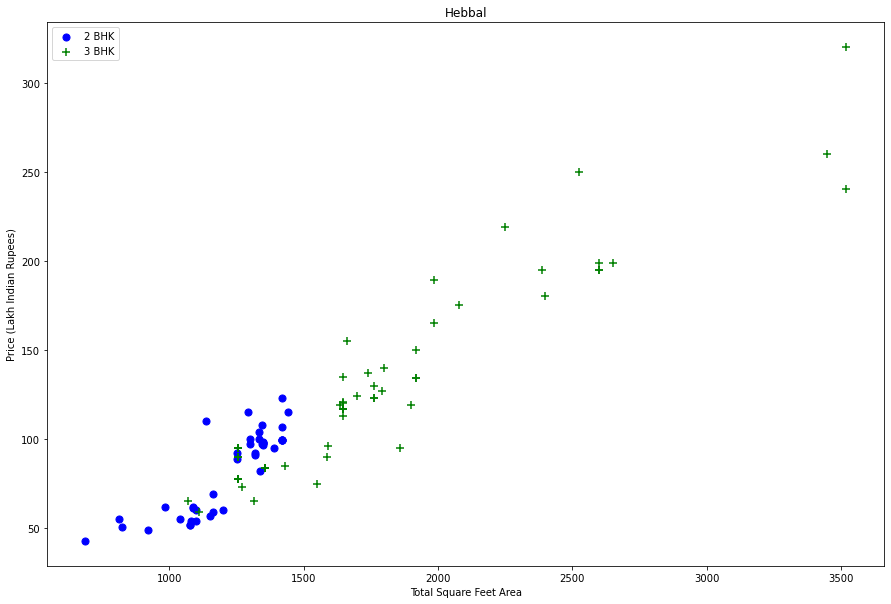

In [55]:
plot_scatter_chart(df7,"Hebbal")

In [56]:
def remove_bhk_outliers(df):
    exclude_indices = np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }
        for bhk, bhk_df in location_df.groupby('bhk'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis='index')
df8 = remove_bhk_outliers(df7)
# df8 = df7.copy()
df8.shape

(7318, 7)

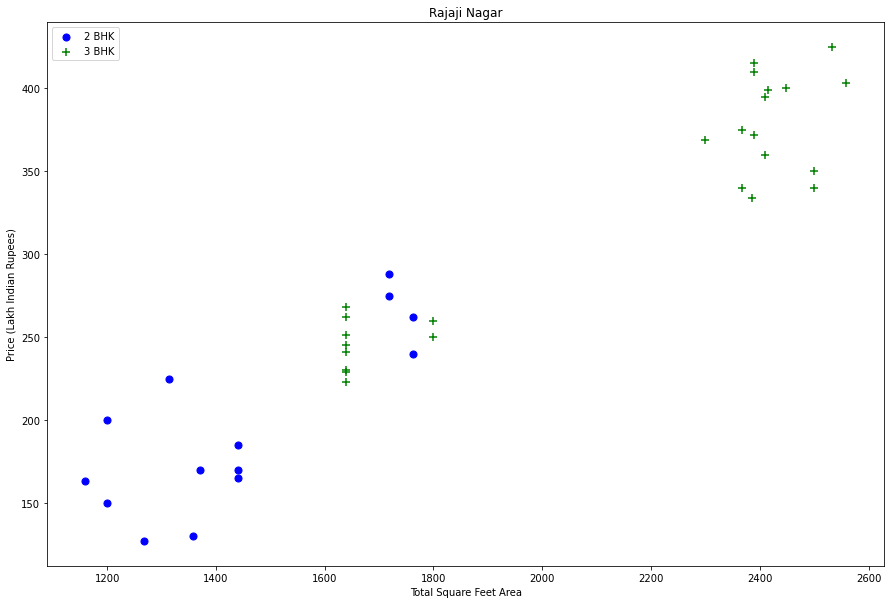

In [57]:
plot_scatter_chart(df8,"Rajaji Nagar")

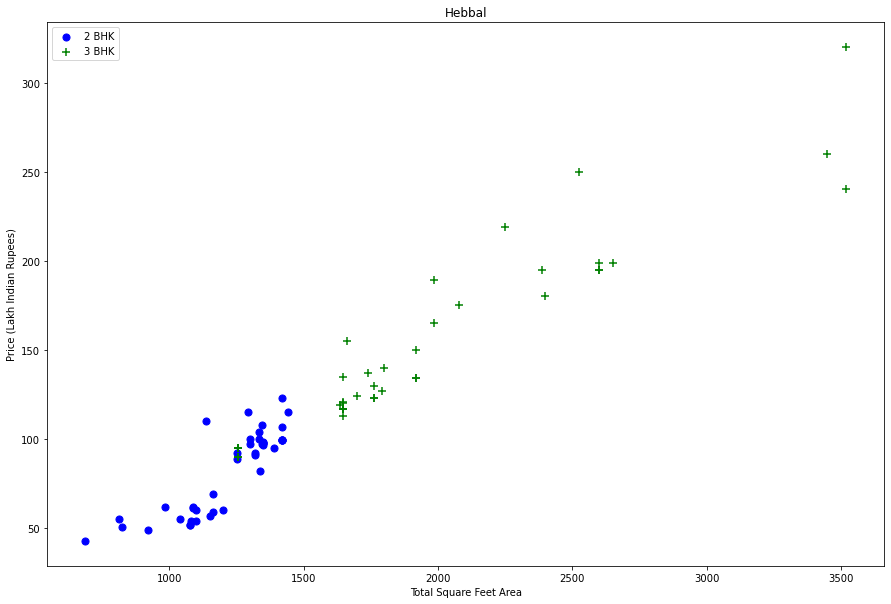

In [58]:
plot_scatter_chart(df8,"Hebbal")

Text(0, 0.5, 'Count')

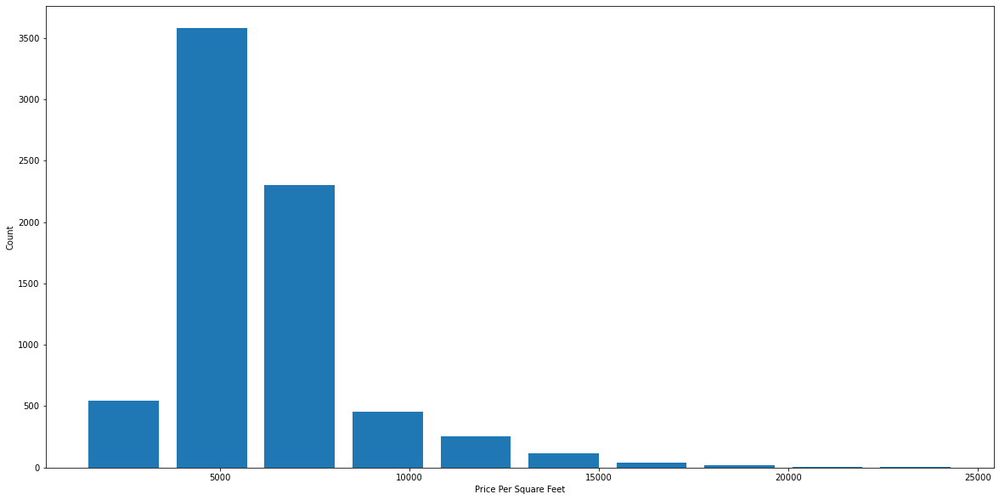

In [59]:
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(df8.price_per_sqft,rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

Text(0, 0.5, 'Count')

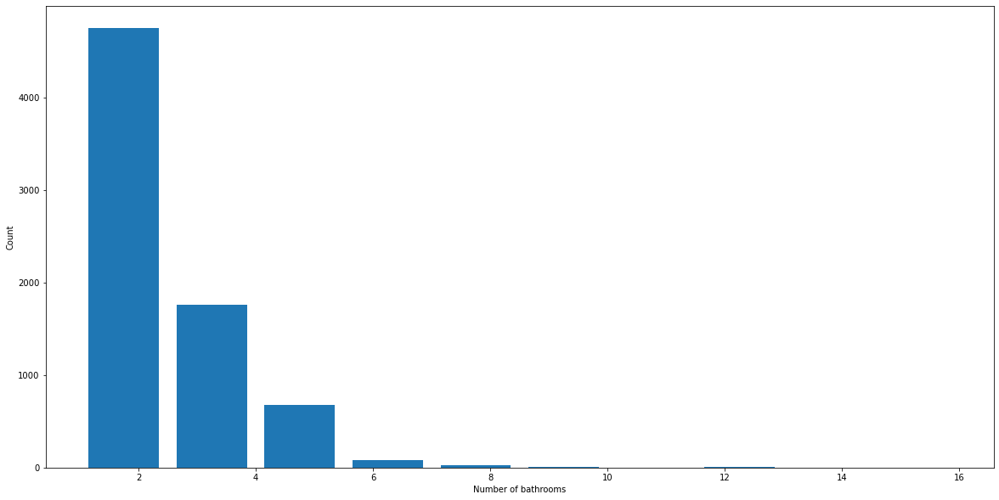

In [60]:
plt.hist(df8.bath,rwidth=0.8)
plt.xlabel("Number of bathrooms")
plt.ylabel("Count")

In [61]:
df8[df8.bath>10]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
5277,Neeladri Nagar,10 BHK,4000.0,12.0,160.0,10,4000
8483,other,10 BHK,12000.0,12.0,525.0,10,4375
8572,other,16 BHK,10000.0,16.0,550.0,16,5500
9307,other,11 BHK,6000.0,12.0,150.0,11,2500
9638,other,13 BHK,5425.0,13.0,275.0,13,5069


In [62]:
df8[df8.bath>df8.bhk+2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
1626,Chikkabanavar,4 Bedroom,2460.0,7.0,80.0,4,3252
5238,Nagasandra,4 Bedroom,7000.0,8.0,450.0,4,6428
6711,Thanisandra,3 BHK,1806.0,6.0,116.0,3,6423
8408,other,6 BHK,11338.0,9.0,1000.0,6,8819


In [63]:
df9 = df8[df8.bath<df8.bhk+2]
df9.shape

(7240, 7)

In [64]:
df9.head(2)

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,1st Block Jayanagar,4 BHK,2850.0,4.0,428.0,4,15017
1,1st Block Jayanagar,3 BHK,1630.0,3.0,194.0,3,11901


In [65]:
df10 = df9.drop(['size','price_per_sqft'],axis='columns')
df10.head(3)

,location,total_sqft,bath,price,bhk
0,1st Block Jayanagar,2850.0,4.0,428.0,4
1,1st Block Jayanagar,1630.0,3.0,194.0,3
2,1st Block Jayanagar,1875.0,2.0,235.0,3


In [66]:
dummies= pd.get_dummies(df10.location)
dummies.head(3)

,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,8th Phase JP Nagar,9th Phase JP Nagar,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [67]:
df11 = pd.concat([df10,dummies.drop('other',axis = 'columns')],axis='columns')
df11.head(3)

,location,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,1st Block Jayanagar,2850.0,4.0,428.0,4,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1st Block Jayanagar,1630.0,3.0,194.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1st Block Jayanagar,1875.0,2.0,235.0,3,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [68]:
df12 = df11.drop('location',axis='columns')
df12.head(2)

,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,428.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,194.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [69]:
df12.shape

(7240, 244)

In [70]:
X = df12.drop('price',axis='columns')
X.head()

,total_sqft,bath,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [71]:
df12.head(10)

,total_sqft,bath,price,bhk,1st Block Jayanagar,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,...,Vijayanagar,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur
0,2850.0,4.0,428.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,194.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,235.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,130.0,3,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,148.0,2,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,2750.0,4.0,413.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,2450.0,4.0,368.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1875.0,3.0,167.0,3,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1500.0,5.0,85.0,5,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,2065.0,4.0,210.0,3,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [72]:
y = df12.price
y.head()

0    428.0
1    194.0
2    235.0
3    130.0
4    148.0
Name: price, dtype: float64

In [73]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=10)

In [74]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.8539792229183085

In [75]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([0.79980866, 0.76902169, 0.84687915, 0.86832888, 0.85978489])

# comparing different algorithms 

In [76]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)

,model,best_score,best_params
0,linear_regression,0.828765,{'normalize': False}
1,lasso,0.698825,"{'alpha': 1, 'selection': 'cyclic'}"
2,decision_tree,0.734699,"{'criterion': 'mse', 'splitter': 'random'}"


In [77]:
def predict_price(location,sqft,bath,bhk):    
    loc_index = np.where(X.columns==location)[0][0]

    x = np.zeros(len(X.columns))
    x[0] = sqft
    x[1] = bath
    x[2] = bhk
    if loc_index >= 0:
        x[loc_index] = 1

    return lr_clf.predict([x])[0]

In [78]:
predict_price('2nd Stage Nagarbhavi',2000, 2, 2)

262.3186236461574

In [79]:
# #mean squared error = [(y-yhat)^2 ]/ N
# def mean_squared_error(y_true, y_predicted):
     
#     # Calculating the loss or cost
#     cost = np.sum((y_true-y_predicted)**2) / len(y_true)
#     return cost

In [80]:
# 33
# #x1= df10['total_sqft']
# #x2= df10['bhk']
# #x3= df10['bath']
# Y = df10['price']
# #x=x1+x2+x3
# #X=x1+x2+x3
# X = df10['total_sqft']

In [81]:
# def gradient_descent(x, y, iterations = 1000, learning_rate = 0.0001,
#                      stopping_threshold = 1e-6):
     
#     # Initializing weight, bias, learning rate and iterations
#     current_weight = 0.1
#     current_bias = 0.01
#     iterations = iterations
#     learning_rate = learning_rate
#     n = float(len(x))
     
#     costs = []
#     weights = []
#     previous_cost = None
     
#     # Estimation of optimal parameters
#     for i in range(iterations):
         
#         # Making predictions
#         y_predicted = (current_weight * X) + current_bias
         
#         # Calculationg the current cost
#         current_cost = mean_squared_error(y, y_predicted)
 
#         # If the change in cost is less than or equal to
#         # stopping_threshold we stop the gradient descent
#         if previous_cost and abs(previous_cost-current_cost)<=stopping_threshold:
#             break
         
#         previous_cost = current_cost
 
#         costs.append(current_cost)
#         weights.append(current_weight)
         
#         # Calculating the gradients : yhat = wx+b
#         # cost funtion = 1/n (sum (y-(wx+b))^2
#         #so the derivative of that with respect to w is 2/n (sum(y-(wx+b)) * derivative of (wx+b) wich is x )
#         #refer under cost function section or parial derivatives
#         weight_derivative = -(2/n) * sum(x * (y-y_predicted)) #derivative with respect to w
#         bias_derivative = -(2/n) * sum(y-y_predicted) #derivative with respect to b
         
#         # Updating weights and bias
#         current_weight = current_weight - (learning_rate * weight_derivative)
#         current_bias = current_bias - (learning_rate * bias_derivative)
                 
#         # Printing the parameters for each 1000th iteration
#         print(f"Iteration {i+1}: Cost {current_cost}, Weight \
#         {current_weight}, Bias {current_bias}")
     
     
#     # Visualizing the weights and cost at for all iterations
#     plt.figure(figsize = (8,6))
#     plt.plot(weights, costs)
#     plt.scatter(weights, costs, marker='o', color='red')
#     plt.title("Cost vs Weights")
#     plt.ylabel("Cost")
#     plt.xlabel("Weight")
#     plt.show()
     
#     return current_weight, current_bias

In [82]:
# df10[['total_sqft','bath','bhk']]

In [83]:
# df10['price']

In [84]:
# def main():
     
#     # Data
#     X = df10[['total_sqft'],['bath'],['bhk']]
#     Y = df10['price']
 
#     # Estimating weight and bias using gradient descent
#     estimated_weight, eatimated_bias = gradient_descent(X, Y, iterations=100)
#     print(f"Estimated Weight: {estimated_weight}\nEstimated Bias: {eatimated_bias}")
 
#     # Making predictions using estimated parameters
#     Y_pred = estimated_weight*X + eatimated_bias
 
#     # Plotting the regression line
#     plt.figure(figsize = (8,6))
#     plt.scatter(X, Y, marker='o', color='red')
#     plt.plot([min(X), max(X)], [min(Y_pred), max(Y_pred)], color='blue',markerfacecolor='red',
#              markersize=10,linestyle='dashed')
#     plt.xlabel("X")
#     plt.ylabel("Y")
#     plt.show()
 
     
# if __name__=="__main__":
#     main()

In [85]:
# from sklearn.linear_model import LinearRegression
# lm= LinearRegression()

In [86]:
# #Multiple Linear Regression without the Area
# Z = df10[['bhk','total_sqft','bath']]

# lm.fit(Z,df10['price'])


In [87]:
# Yhat = lm.predict([[2,2000,2]])

In [88]:

# print(Yhat)

In [89]:
# import pickle
# with open('banglore_home_prices_model.pickle','wb') as f:
#     pickle.dump(lr_clf,f)

In [90]:
# dummies1 = pd.get_dummies(df10.bath)

In [91]:
# dummies1.head(10)

In [92]:
from sklearn import preprocessing
x_RM = preprocessing.scale(df10['total_sqft'])
x_LSTAT = preprocessing.scale(df10['bhk'])
y = df10['price']

In [93]:
from pylab import rcParams
rcParams['figure.figsize'] = 12,8

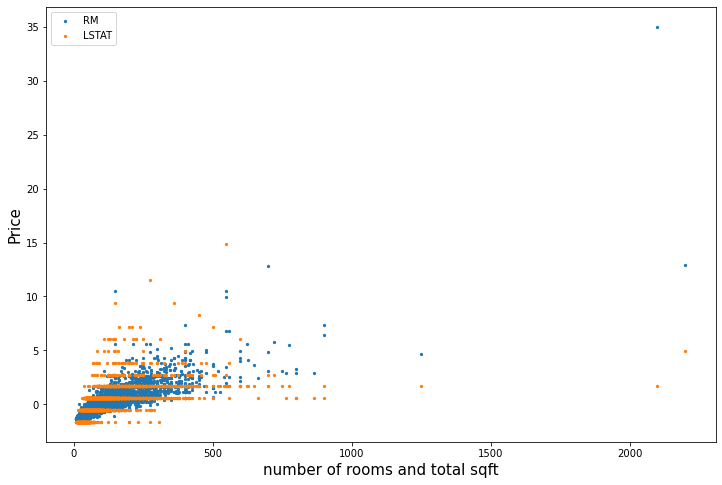

In [94]:
plt.scatter(y, x_RM, s=5, label = 'RM')
plt.scatter(y, x_LSTAT, s=5, label = 'LSTAT')
plt.legend(fontsize=15)
plt.xlabel('number of rooms and total sqft', fontsize=15)
plt.ylabel('Price', fontsize=15)
plt.legend()
plt.show()

In [95]:
x = np.c_[np.ones(x_RM.shape[0]),x_RM, x_LSTAT]

In [96]:
# Parameters required for Gradient Descent
alpha = 0.0001   #learning rate
m = y.size  #no. of samples
np.random.seed(10)
theta = np.random.rand(3)  #initializing theta with some random values

In [97]:
def gradient_descent(x, y, m, theta, alpha):
    cost_list = []   #to record all cost values to this list
    theta_list = []  #to record all theta_0 and theta_1 values to this list 
    prediction_list = []
    run = True
    cost_list.append(1e10)    #we append some large value to the cost list
    i=0
    while run:
        prediction = np.dot(x, theta)   #predicted y values theta_0*x0+theta_1*x1
        prediction_list.append(prediction)
        error = prediction - y
        cost = 1/(2*m) * np.dot(error.T, error)   #  (1/2m)*sum[(error)^2]
        cost_list.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x.T, error))   # alpha * (1/m) * sum[error*x]
        theta_list.append(theta)
        if cost_list[i]-cost_list[i+1] < 1e-9:   #checking if the change in cost function is less than 10^(-9)
            run = False

        i+=1
    cost_list.pop(0)   # Remove the large number we added in the begining 
    return prediction_list, cost_list, theta_list

In [98]:
 prediction_list, cost_list, theta_list = gradient_descent(x, y, m, theta, alpha)
 theta = theta_list[-1]

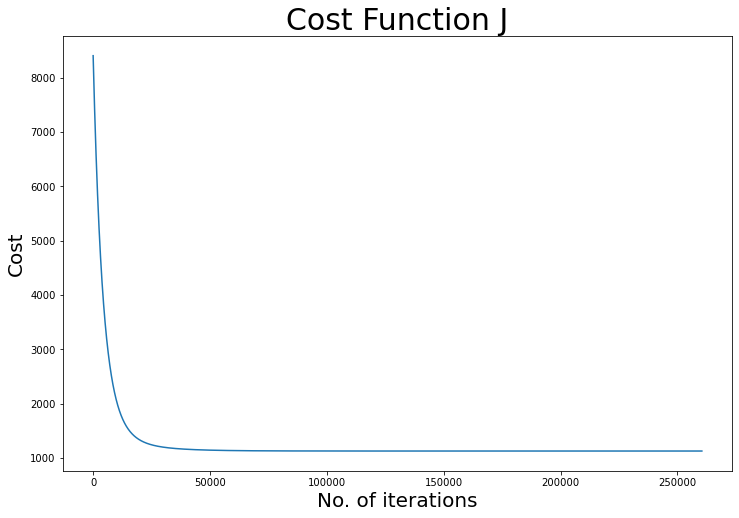

In [99]:

plt.title('Cost Function J', size = 30)
plt.xlabel('No. of iterations', size=20)
plt.ylabel('Cost', size=20)
plt.plot(cost_list)
plt.show()

In [100]:
yp = theta[0] +theta[1]*x[:,1] + theta[2]*x[:,2]

In [101]:
# yp

In [102]:
# MSE_equ = ((yp-y)**2).mean()  #Using yp from equation of hyperplane
# MSE_GD = ((prediction_list[-1]-y)**2).mean()  #From Gradient Descent


# print('Mean Square Error using equation of hyperplane : {}'.format(round(MSE_equ,3)))
# print('Mean Square Error from Gradient Descent prediction : {}'.format(round(MSE_GD,3)))

In [103]:
 from sklearn.linear_model import LinearRegression

In [104]:
ys = df10['price']
xs = np.c_[df10['total_sqft'],df10['bhk']]

In [105]:
 ys.shape, xs.shape


((7240,), (7240, 2))

In [106]:
xs = preprocessing.scale(xs)
ys = preprocessing.scale(ys)

In [107]:
lm = LinearRegression()

#Fitting the model
lm = lm.fit(xs,ys)

In [108]:
pred = lm.predict(xs)

In [109]:
pred.shape


(7240,)

In [110]:
intercept = lm.intercept_
Theta_0 = lm.coef_[0]
Theta_1 = lm.coef_[1]

print('Intercept : {}'.format(round(intercept,3)))
print('Theta_0 : {}'.format(round(Theta_0,4)))
print('Theta_1 : {}'.format(round(Theta_1,4)))

Intercept : 0.0
Theta_0 : 0.8318
Theta_1 : 0.0137


In [111]:
r2_sk = lm.score(xs,ys)
print('R square from sci-kit learn: {}'.format(round(r2_sk,4)))

R square from sci-kit learn: 0.7073


In [112]:
r2 = 1 - (sum((y - prediction_list[-1])**2)) / (sum((y - y.mean())**2))
print('R square doing from the scratch: {}'.format(round(r2,4)))

R square doing from the scratch: 0.7073


In [113]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D



# Create a figure and a 3D Axes
fig = plt.figure(figsize=(12,10))
ax = Axes3D(fig)
ax.set_xlabel('total sqft *100', fontsize = 15)
ax.set_ylabel('bhk', fontsize = 15)
ax.set_zlabel('Price', fontsize = 15)

plt.close()

C:\Users\ronal\AppData\Local\Temp\ipykernel_18328\4062768833.py:10: MatplotlibDeprecationWarning: Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.
  ax = Axes3D(fig)


In [114]:
def init():
    ax.scatter(xs[:,0], xs[:,1], ys, c='C6', marker='o', alpha=0.6) 
    x0, x1 = np.meshgrid(xs[:,0], xs[:,1])
    yp = Theta_0 * x0 + Theta_1 * x1
    ax.plot_wireframe(x0,x1,yp, rcount=200,ccount=200, linewidth = 0.5,color='C9', alpha=0.5)
    ax.legend(fontsize=15, labels = ['Data points', 'Hyperplane'])
    return fig,

def animate(i):
    ax.view_init(elev=10., azim=i)
    return fig,


# Animate

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=360, interval=20, blit=True)

# plt.legend(fontsize=15, labels = [''])
anim.save('animation.gif', writer='imagemagick', fps = 30)
plt.close()

MovieWriter imagemagick unavailable; using Pillow instead.



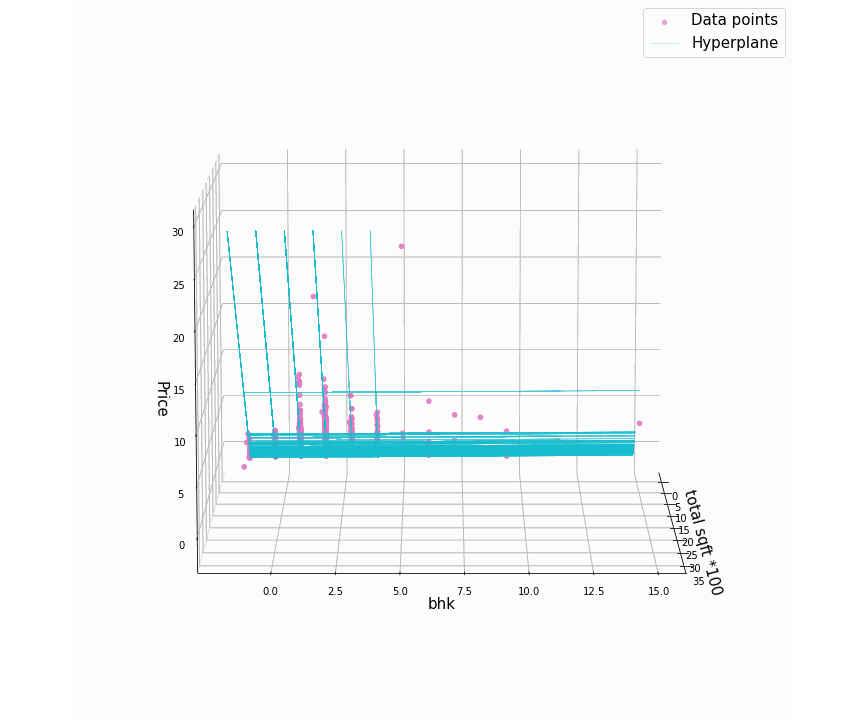

In [115]:
#Display the animation...
import io
import base64
from IPython.display import HTML

filename = 'animation.gif'

video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [116]:
# df10['total_sqft']